<a href="https://colab.research.google.com/github/maddiejane25/Project-1/blob/main/FINAL_CODE_UPDATE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **IMPORT LIBRARIES**

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
plt.rcParams['figure.figsize'] = [10, 8]

# **IMPORT AND READ DATA**

In [2]:
# Upload the csv file
from google.colab import files
uploaded = files.upload()

Saving alzheimers_disease_data.csv to alzheimers_disease_data.csv


In [3]:
# Import the csv file
alzheimer_df = pd.read_csv('alzheimers_disease_data.csv')
alzheimer_df.head()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,0,0,1.725883,0,0,0,1,0,0,XXXConfid
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,2.592424,0,0,0,0,1,0,XXXConfid
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,7.119548,0,1,0,1,0,0,XXXConfid
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,1,6.481226,0,0,0,0,0,0,XXXConfid
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0.014691,0,0,1,1,0,0,XXXConfid


In [4]:
# Get info
alzheimer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PatientID                  2149 non-null   int64  
 1   Age                        2149 non-null   int64  
 2   Gender                     2149 non-null   int64  
 3   Ethnicity                  2149 non-null   int64  
 4   EducationLevel             2149 non-null   int64  
 5   BMI                        2149 non-null   float64
 6   Smoking                    2149 non-null   int64  
 7   AlcoholConsumption         2149 non-null   float64
 8   PhysicalActivity           2149 non-null   float64
 9   DietQuality                2149 non-null   float64
 10  SleepQuality               2149 non-null   float64
 11  FamilyHistoryAlzheimers    2149 non-null   int64  
 12  CardiovascularDisease      2149 non-null   int64  
 13  Diabetes                   2149 non-null   int64

In [5]:
# Search for missing or duplicate data
print('Null:', alzheimer_df.isnull().sum().sum())
print('Duplicate:', alzheimer_df.duplicated().sum())

Null: 0
Duplicate: 0


# **EXPLORATORY DATA ANALYSIS**

In [6]:
# Drop columns
alzheimer_df.drop((['DoctorInCharge']), axis = 1, inplace = True)

In [7]:
# Change Binary Columns from 0/1 to No/Yes
alzheimer_df_yesno = alzheimer_df.copy()
alzheimer_df_yesno[['Smoking', 'FamilyHistoryAlzheimers',
                                   'CardiovascularDisease', 'Diabetes',
                                   'Depression', 'HeadInjury', 'Hypertension',
                                   'MemoryComplaints', 'BehavioralProblems',
                                   'Confusion', 'Disorientation', 'PersonalityChanges',
                                   'DifficultyCompletingTasks', 'Forgetfulness', 'Diagnosis']] = alzheimer_df[['Smoking', 'FamilyHistoryAlzheimers',
                                   'CardiovascularDisease', 'Diabetes',
                                   'Depression', 'HeadInjury', 'Hypertension',
                                   'MemoryComplaints', 'BehavioralProblems',
                                   'Confusion', 'Disorientation', 'PersonalityChanges',
                                   'DifficultyCompletingTasks', 'Forgetfulness', 'Diagnosis']].replace({0: 'No', 1: 'Yes'})

# Change Gender column
alzheimer_df_yesno['Gender'] = alzheimer_df['Gender'].replace({0: 'Male', 1: 'Female'})

# Change Ethnicity column
alzheimer_df_yesno['Ethnicity'] = alzheimer_df['Ethnicity'].replace({0: 'Caucasian', 1: 'African American', 2: 'Asian', 3: 'Other'})

# Change EducationLevel column
alzheimer_df_yesno['EducationLevel'] = alzheimer_df['EducationLevel'].replace({0: 'None', 1: 'High School', 2: 'Bachelors', 3: 'Higher'})

# Display Changes
alzheimer_df_yesno.head(10)

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
0,4751,73,Male,Caucasian,Bachelors,22.927749,No,13.297218,6.327112,1.347214,...,6.518877,No,No,1.725883,No,No,No,Yes,No,No
1,4752,89,Male,Caucasian,None,26.827681,No,4.542524,7.619885,0.518767,...,7.118696,No,No,2.592424,No,No,No,No,Yes,No
2,4753,73,Male,Other,High School,17.795882,No,19.555085,7.844988,1.826335,...,5.895077,No,No,7.119548,No,Yes,No,Yes,No,No
3,4754,74,Female,Caucasian,High School,33.800817,Yes,12.209266,8.428001,7.435604,...,8.965106,No,Yes,6.481226,No,No,No,No,No,No
4,4755,89,Male,Caucasian,None,20.716974,No,18.454356,6.310461,0.795498,...,6.045039,No,No,0.014691,No,No,Yes,Yes,No,No
5,4756,86,Female,African American,High School,30.626886,No,4.140144,0.211062,1.584922,...,5.510144,No,No,9.015686,Yes,No,No,No,No,No
6,4757,68,Male,Other,Bachelors,38.387622,Yes,0.646047,9.257695,5.897388,...,6.062124,No,No,9.236328,No,No,No,No,Yes,No
7,4758,75,Male,Caucasian,High School,18.776009,No,13.723826,4.649451,8.341903,...,3.401374,No,No,4.517248,Yes,No,No,No,Yes,Yes
8,4759,72,Female,African American,None,27.833188,No,12.167848,1.531360,6.736882,...,7.396061,No,Yes,0.756232,No,No,Yes,No,No,No
9,4760,87,Male,Caucasian,None,35.456302,Yes,16.028688,6.440773,8.086019,...,1.148904,No,Yes,4.554394,No,No,No,No,No,No


In [8]:
# Make a smaller dataset for Diagnosis = Yes and for Diagnosis = No
diagnosis_yes = alzheimer_df_yesno[alzheimer_df_yesno['Diagnosis'] == 'Yes']
diagnosis_no = alzheimer_df_yesno[alzheimer_df_yesno['Diagnosis'] == 'No']

# How many individuals from the data set have been diagnosed with Alzheimers?
print("Individuals in the dataset who were diagnosed with Alzheimer\'s:", diagnosis_yes.shape[0])
print("Individuals in the dataset who were NOT diagnosed with Alzheimer\'s:", diagnosis_no.shape[0])

Individuals in the dataset who were diagnosed with Alzheimer's: 760
Individuals in the dataset who were NOT diagnosed with Alzheimer's: 1389


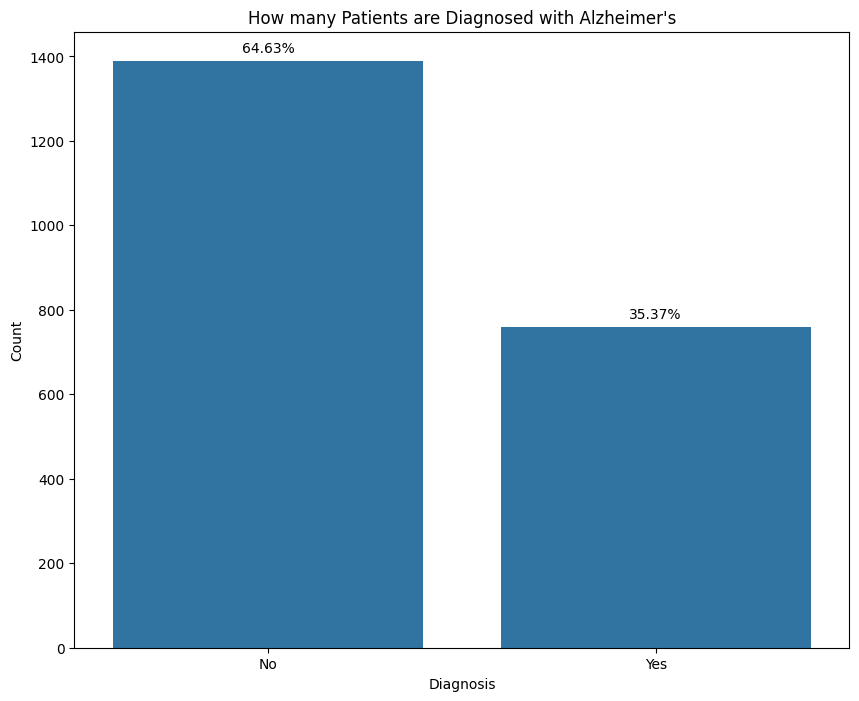

<Figure size 1000x800 with 0 Axes>

In [9]:
# Calculate total number of rows in the dataset for percentage calculations
total = len(alzheimer_df_yesno)

# Plot a countplot of Education Level vs Diagnosis
ax = sns.countplot(x='Diagnosis', data=alzheimer_df_yesno)

# Title and labels
plt.title('How many Patients are Diagnosed with Alzheimer\'s')
plt.xlabel('Diagnosis')
plt.ylabel('Count')

# Adding percentage labels on top of the bars
for p in ax.patches:
    height = p.get_height()
    percentage = f'{(height / total) * 100:.2f}%'
    ax.annotate(percentage,
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='center', xytext=(0, 9),
                textcoords='offset points')

# Show the plot
plt.show()
plt.savefig('PatientDiagnosiscount.png')

# **DEMOGRAPHICS**
* Age
* Gender
* Ethnicity
* Education Level





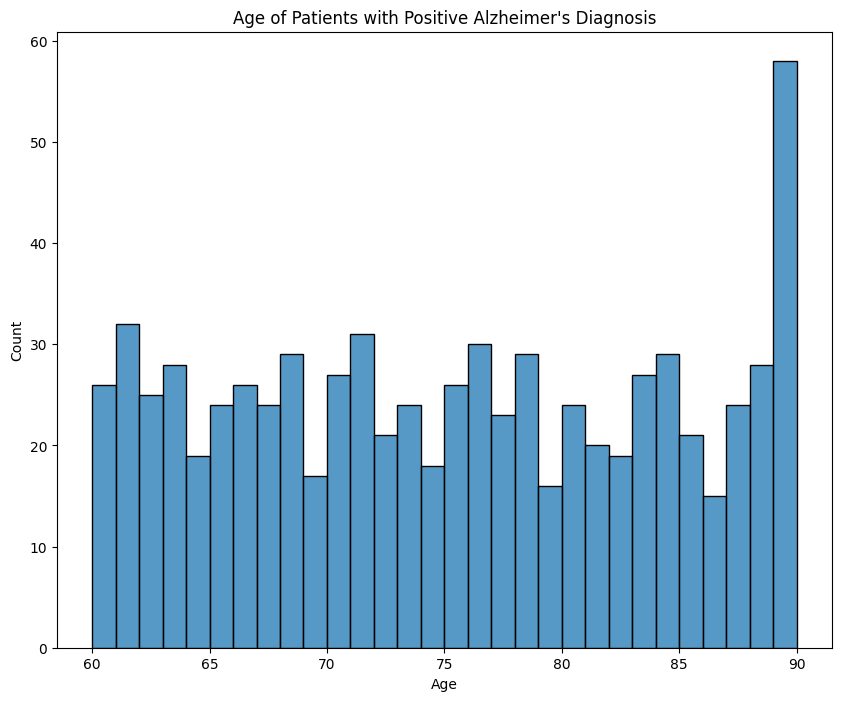

<Figure size 1000x800 with 0 Axes>

In [10]:
# Age Distribution by Diagnosis
sns.histplot(data=diagnosis_yes, x='Age', binwidth=1)
plt.title('Age of Patients with Positive Alzheimer\'s Diagnosis')
plt.xlabel('Age')
plt.ylabel('Count')

# Display the plot
plt.show()
plt.savefig('AgeDistribution.png')

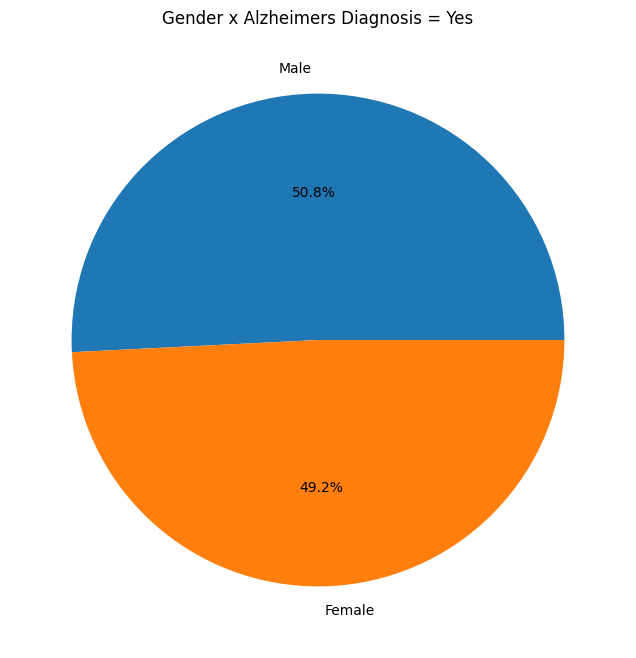

<Figure size 1000x800 with 0 Axes>

In [11]:
# Calculate total number of rows in the dataset for percentage calculations
total = len(alzheimer_df_yesno)

# Group data
diagnosis_yes_count = diagnosis_yes['Gender'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Gender x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('GenderDistribution.png')

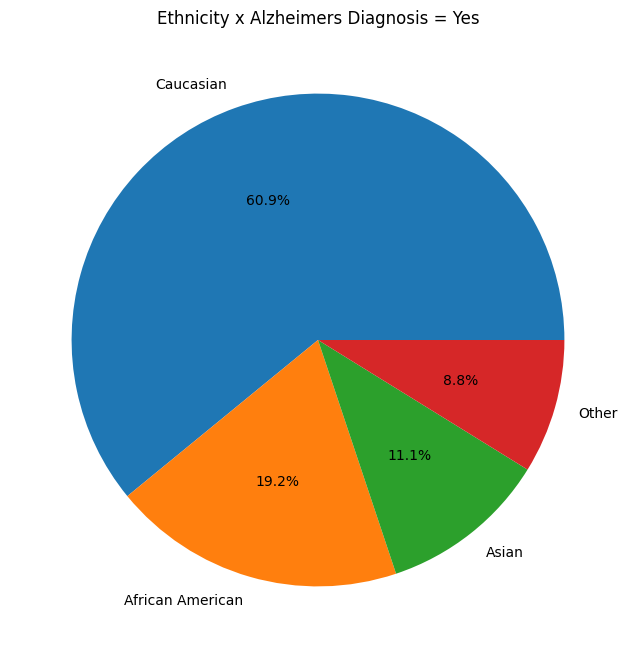

<Figure size 1000x800 with 0 Axes>

In [12]:
# Group data
diagnosis_yes_count = diagnosis_yes['Ethnicity'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Ethnicity x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('EthnicityDistribution.png')

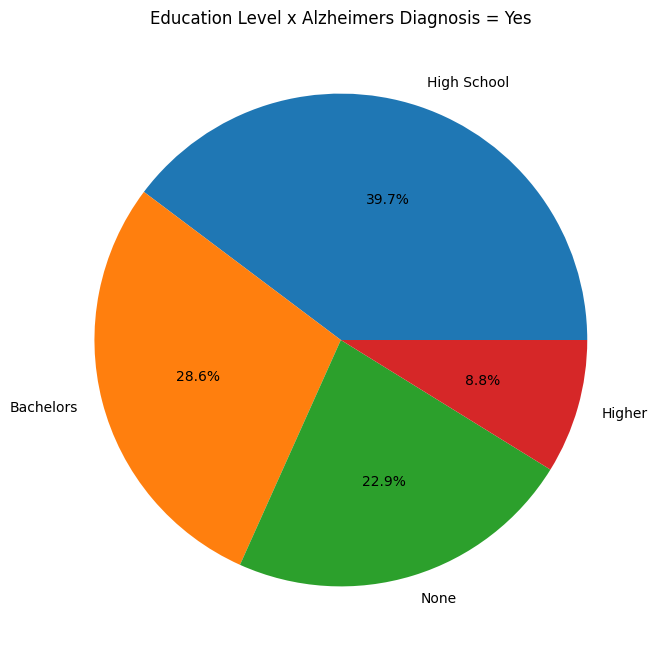

<Figure size 1000x800 with 0 Axes>

In [13]:
# Group data
diagnosis_yes_count = diagnosis_yes['EducationLevel'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Education Level x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('EducationLevelDistribution.png')

# **ASSESSMENTS**
* MMSE
* Functional Assessment
* ADL

In [14]:
# Plot the MMSE and Diagnosis data
alt.Chart(alzheimer_df_yesno).mark_boxplot().encode(
    x='Diagnosis:N',
    y=alt.Y('MMSE:Q', scale=alt.Scale(domain=[0, 30])))

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.Chart(...)

In [15]:
# Plot the FunctionalAssessment and Diagnosis data
alt.Chart(alzheimer_df_yesno).mark_boxplot().encode(
    x='Diagnosis:N',
    y=alt.Y('FunctionalAssessment:Q', scale=alt.Scale(domain=[0, 10])))

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.Chart(...)

In [16]:
# Plot the ADL and Diagnosis data
alt.Chart(alzheimer_df_yesno).mark_boxplot().encode(
    x='Diagnosis:N',
    y=alt.Y('ADL:Q', scale=alt.Scale(domain=[0, 10])))

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.Chart(...)

# **LIFESTYLE**
* BMI
* Smoking
* Alcohol Consumption
* Pyhsical Activity
* Diet Quality
* Sleep Quality

In [17]:
lifestyle = alzheimer_df_yesno[['Diagnosis','BMI', 'Smoking', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality']]
lifestyle.head()

,Diagnosis,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality
0,No,22.927749,No,13.297218,6.327112,1.347214,9.025679
1,No,26.827681,No,4.542524,7.619885,0.518767,7.151293
2,No,17.795882,No,19.555085,7.844988,1.826335,9.673574
3,No,33.800817,Yes,12.209266,8.428001,7.435604,8.392554
4,No,20.716974,No,18.454356,6.310461,0.795498,5.597238


In [18]:
lifestyle_bmi = lifestyle.groupby('Diagnosis')['BMI'].mean()
lifestyle_bmi

,BMI
Diagnosis,
No,27.515092
Yes,27.912670


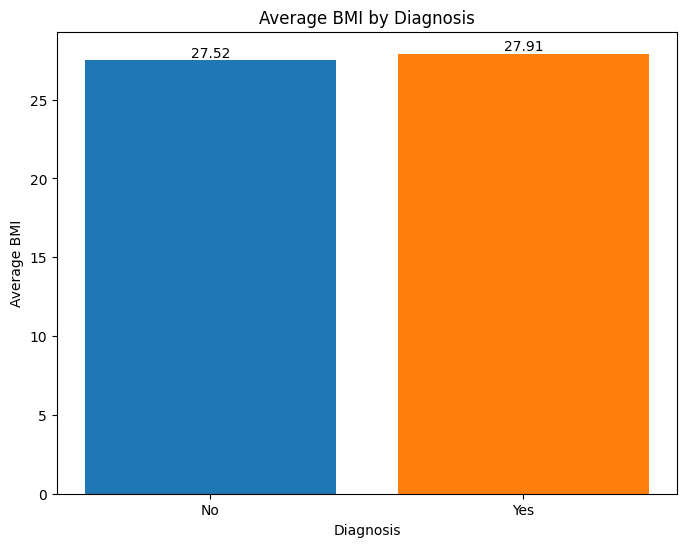

In [19]:
# Create a bar graph for BMI
plt.figure(figsize=(8, 6))
plt.bar(lifestyle_bmi.index, lifestyle_bmi.values, color = ['C0','C1'])
plt.title('Average BMI by Diagnosis')
plt.xlabel('Diagnosis')
plt.ylabel('Average BMI')
plt.title('Average BMI by Diagnosis')

# Add BMI levels on top of the bar graph
for i, bmi in enumerate(lifestyle_bmi.values):
    plt.text(i, bmi, f'{bmi:.2f}', ha='center', va='bottom')

# Plot the results
plt.show()

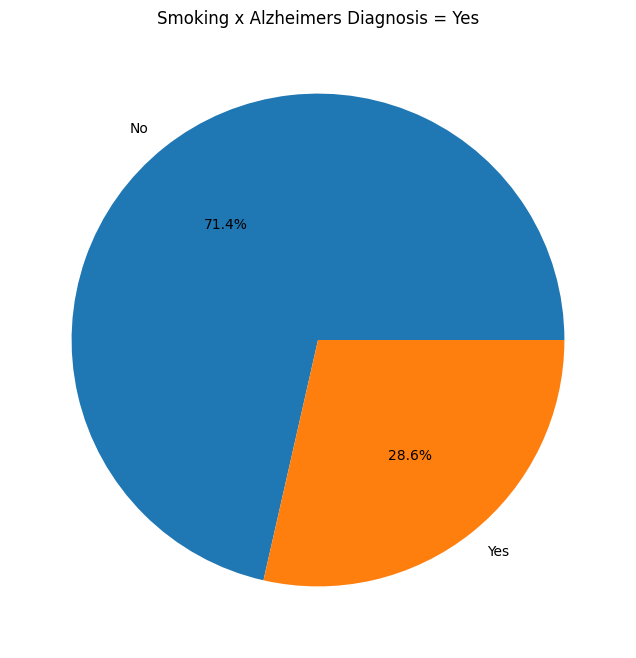

<Figure size 1000x800 with 0 Axes>

In [20]:
# Group data
diagnosis_yes_count = diagnosis_yes['Smoking'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Smoking x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('SmokingDistribution.png')

In [21]:
lifestyle_alcohol = lifestyle.groupby('Diagnosis')['AlcoholConsumption'].mean()
lifestyle_alcohol

,AlcoholConsumption
Diagnosis,
No,10.071880
Yes,9.980156


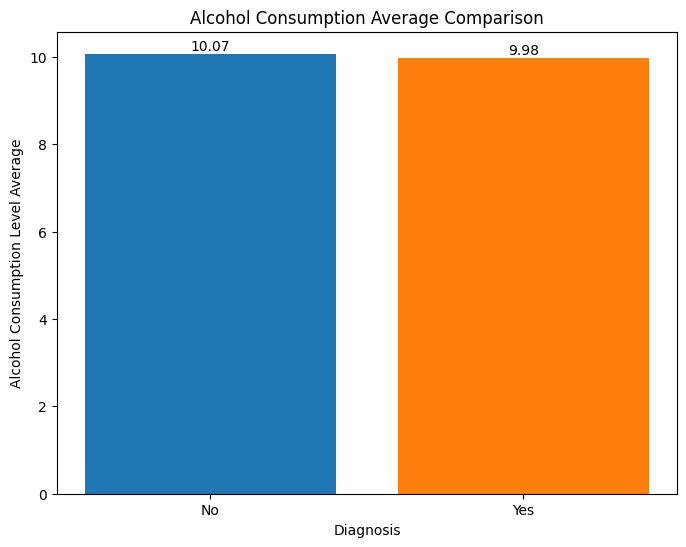

In [22]:
# Create a bar graph for Alcohol Consumption
plt.figure(figsize=(8, 6))
plt.bar(lifestyle_alcohol.index, lifestyle_alcohol.values, color=['C0', 'C1'])
plt.title('Alcohol Consumption Average Comparison')
plt.xlabel('Diagnosis')
plt.ylabel('Alcohol Consumption Level Average')

# Add Alcohol Consumption on top of the bar graph
for i, alcohol in enumerate(lifestyle_alcohol.values):
    plt.text(i, alcohol, f'{alcohol:.2f}', ha='center', va='bottom')

# Plot the results
plt.show()

In [23]:
lifestyle_activity = lifestyle.groupby('Diagnosis')['PhysicalActivity'].mean()
lifestyle_activity

,PhysicalActivity
Diagnosis,
No,4.90764
Yes,4.94316


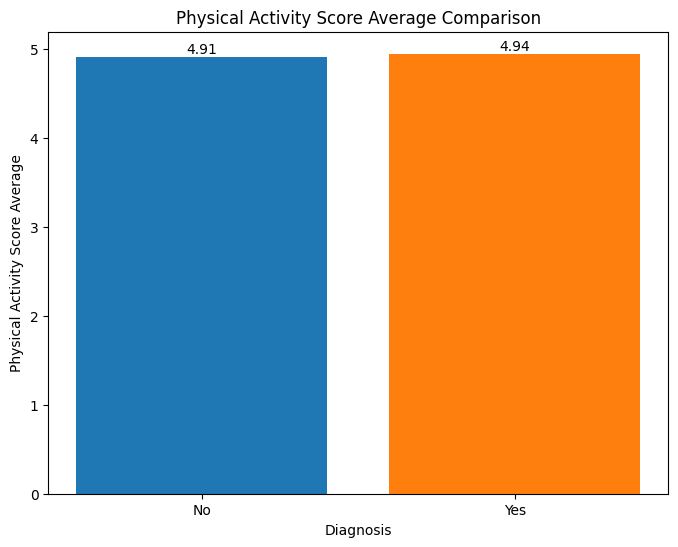

In [24]:
# Create a bar graph for Physical Activity score
plt.figure(figsize=(8, 6))
plt.bar(lifestyle_activity.index, lifestyle_activity.values, color=['C0', 'C1'])
plt.title('Physical Activity Score Average Comparison')
plt.xlabel('Diagnosis')
plt.ylabel('Physical Activity Score Average')

# Add Physical Activity Score average on top of the bar graph
for i, activity in enumerate(lifestyle_activity.values):
    plt.text(i, activity, f'{activity:.2f}', ha='center', va='bottom')

# Plot the results
plt.show()

In [25]:
lifestyle_diet = lifestyle.groupby('Diagnosis')['DietQuality'].mean()
lifestyle_diet

,DietQuality
Diagnosis,
No,4.974839
Yes,5.026581


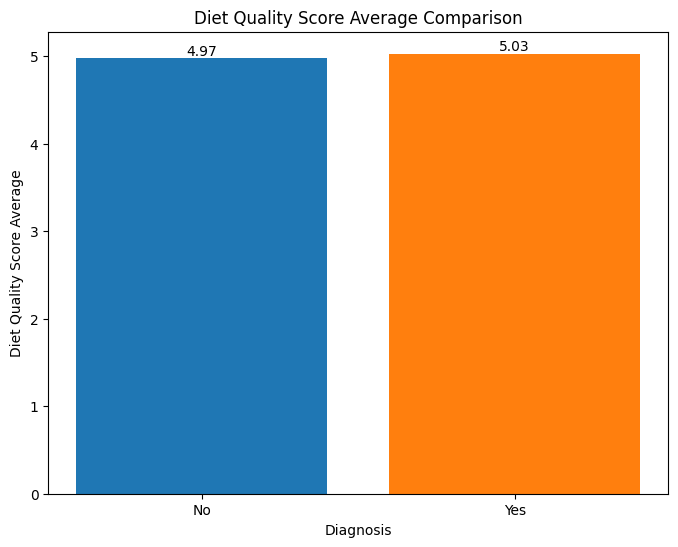

In [26]:
# Create a bar graph for Diet Quality Score
plt.figure(figsize=(8, 6))
plt.bar(lifestyle_diet.index, lifestyle_diet.values, color=['C0', 'C1'])
plt.title('Diet Quality Score Average Comparison')
plt.xlabel('Diagnosis')
plt.ylabel('Diet Quality Score Average')

# Add Diet Quality Score average on top of the bar graph
for i, diet in enumerate(lifestyle_diet.values):
    plt.text(i, diet, f'{diet:.2f}', ha='center', va='bottom')

# Plot the results
plt.show()

In [27]:
lifestyle_sleep = lifestyle.groupby('Diagnosis')['SleepQuality'].mean()
lifestyle_sleep

,SleepQuality
Diagnosis,
No,7.124832
Yes,6.916292


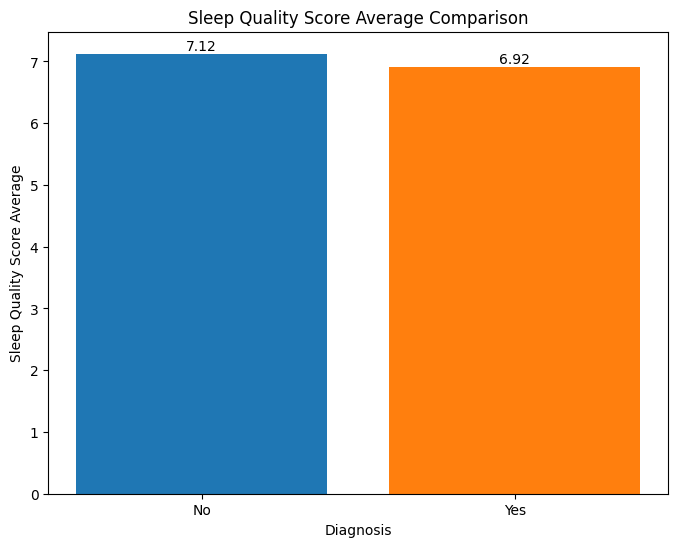

In [28]:
# Create a bar graph for Sleep Quality score
plt.figure(figsize=(8, 6))
plt.bar(lifestyle_sleep.index, lifestyle_sleep.values, color=['C0', 'C1'])
plt.title('Sleep Quality Score Average Comparison')
plt.xlabel('Diagnosis')
plt.ylabel('Sleep Quality Score Average')

# Add Sleep Quality Score average on top of the bar graph
for i, sleep in enumerate(lifestyle_sleep.values):
    plt.text(i, sleep, f'{sleep:.2f}', ha='center', va='bottom')

# Plot the results
plt.show()

# **MEDICAL HISTORY**
* Family History Alzheimers
* Cardiovascular Disease
* Diabetes
* Depression
* Head Injury
* Hypertension

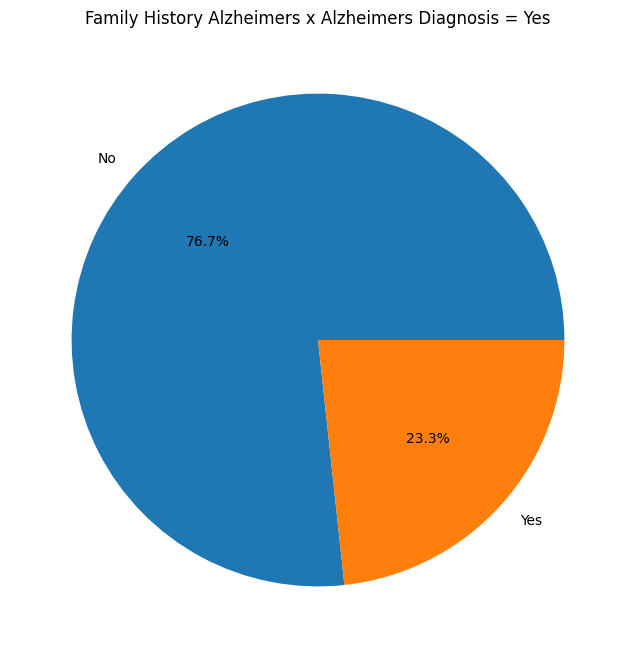

<Figure size 1000x800 with 0 Axes>

In [29]:
# Group data
diagnosis_yes_count = diagnosis_yes['FamilyHistoryAlzheimers'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Family History Alzheimers x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('FamilyHistoryAlzheimers.png')

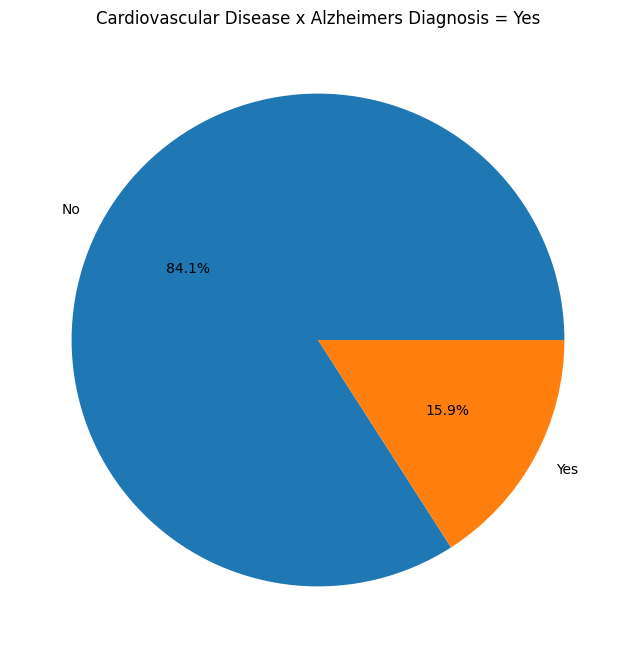

<Figure size 1000x800 with 0 Axes>

In [30]:
# Group data
diagnosis_yes_count = diagnosis_yes['CardiovascularDisease'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Cardiovascular Disease x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('CardiovascularDisease.png')

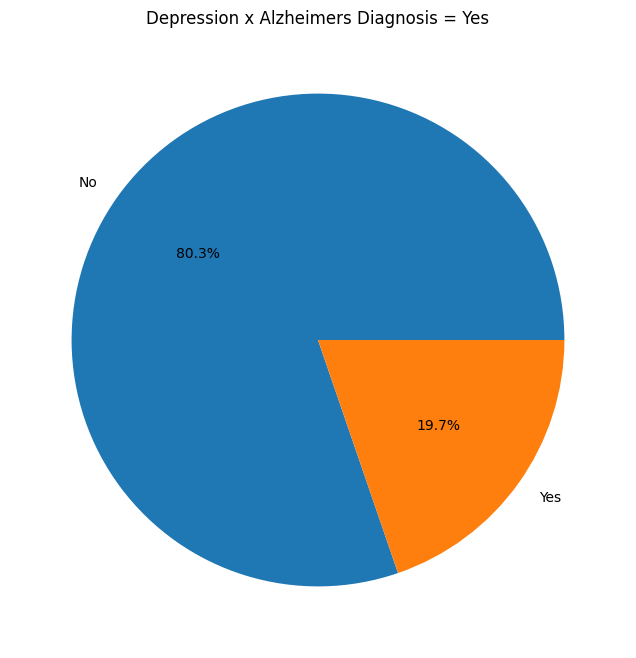

<Figure size 1000x800 with 0 Axes>

In [31]:
# Group data
diagnosis_yes_count = diagnosis_yes['Depression'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Depression x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('Depression.png')

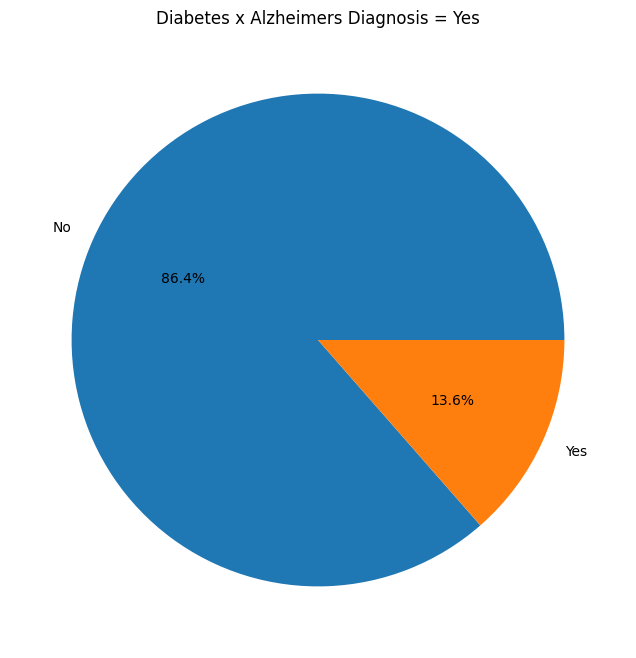

<Figure size 1000x800 with 0 Axes>

In [32]:
# Group data
diagnosis_yes_count = diagnosis_yes['Diabetes'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Diabetes x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('Diabetes.png')

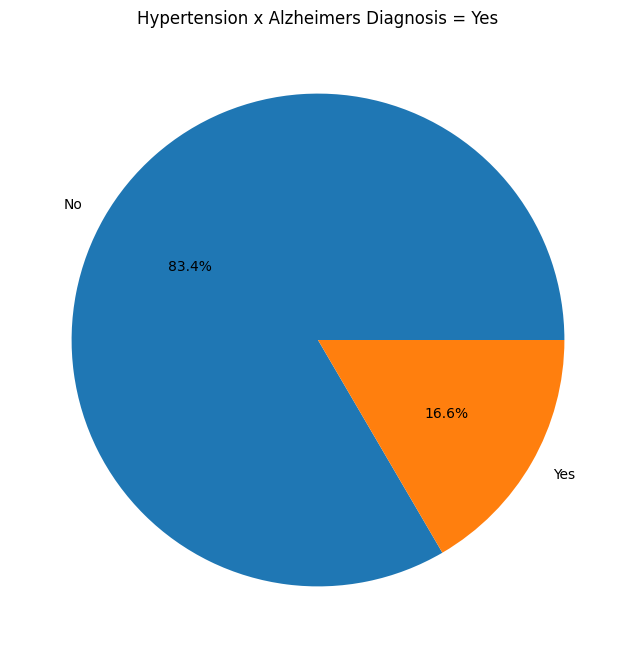

<Figure size 1000x800 with 0 Axes>

In [33]:
# Group data
diagnosis_yes_count = diagnosis_yes['Hypertension'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Hypertension x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('Hypertension.png')

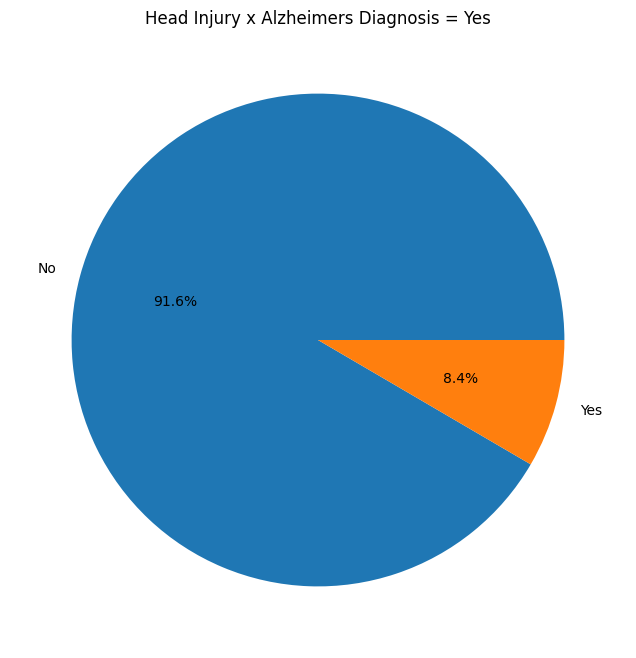

<Figure size 1000x800 with 0 Axes>

In [34]:
# Group data
diagnosis_yes_count = diagnosis_yes['HeadInjury'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Head Injury x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('HeadInjury.png')

# **CLINICAL MEASUREMENTS**
* Systolic BP
* Diastolic BP
* Cholesterol Total
* Cholesterol LDL
* Cholesterol HDL
* Cholesterol Triglycerides


In [35]:
# Create a Clinical Measurement dataframe
clinical_measurements = alzheimer_df_yesno[['SystolicBP', 'DiastolicBP', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides','Diagnosis']]
clinical_measurements

,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,Diagnosis
0,142,72,242.366840,56.150897,33.682563,162.189143,No
1,115,64,231.162595,193.407996,79.028477,294.630909,No
2,99,116,284.181858,153.322762,69.772292,83.638324,No
3,118,115,159.582240,65.366637,68.457491,277.577358,No
4,94,117,237.602184,92.869700,56.874305,291.198780,No
...,...,...,...,...,...,...,...
2144,122,101,280.476824,94.870490,60.943092,234.520123,Yes
2145,152,106,186.384436,95.410700,93.649735,367.986877,Yes
2146,115,118,237.024558,156.267294,99.678209,294.802338,Yes
2147,103,96,242.197192,52.482961,81.281111,145.253746,Yes


In [36]:
# Check if Blood Pressure is appropriate value, if not, drop the value
def check_and_drop(SystolicBP, DiastolicBP):
    if DiastolicBP > SystolicBP:
        return None, None
    else:
        return SystolicBP, DiastolicBP

In [37]:
# Apply the check_and_drop function to the BP columns
alzheimer_df_yesno['SystolicBP'], alzheimer_df_yesno['DiastolicBP'] = zip(*clinical_measurements.apply(lambda row: check_and_drop(row['SystolicBP'], row['DiastolicBP']), axis=1))
alzheimer_df_yesno.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 34 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PatientID                  2149 non-null   int64  
 1   Age                        2149 non-null   int64  
 2   Gender                     2149 non-null   object 
 3   Ethnicity                  2149 non-null   object 
 4   EducationLevel             2149 non-null   object 
 5   BMI                        2149 non-null   float64
 6   Smoking                    2149 non-null   object 
 7   AlcoholConsumption         2149 non-null   float64
 8   PhysicalActivity           2149 non-null   float64
 9   DietQuality                2149 non-null   float64
 10  SleepQuality               2149 non-null   float64
 11  FamilyHistoryAlzheimers    2149 non-null   object 
 12  CardiovascularDisease      2149 non-null   object 
 13  Diabetes                   2149 non-null   objec

In [38]:
# Display SystolicBP and DiastolicBP
display(alzheimer_df_yesno['SystolicBP'].describe())
display(alzheimer_df_yesno['DiastolicBP'].describe())

,SystolicBP
count,1973.000000
mean,137.436898
std,24.626823
min,90.000000
25%,117.000000
50%,138.000000
75%,158.000000
max,179.000000


,DiastolicBP
count,1973.000000
mean,88.028383
std,17.097537
min,60.000000
25%,73.000000
50%,88.000000
75%,103.000000
max,119.000000


In [39]:
# Plot the Systolic Blood Pressure findings on a box plot with diagnosis
alt.Chart(alzheimer_df_yesno).mark_boxplot().encode(
    x='Diagnosis:N',
    y=alt.Y('SystolicBP:Q', scale=alt.Scale(domain=[80, 190])))

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.Chart(...)

In [40]:
# Plot the Diastolic Blood Pressure findings on a box plot with diagnosis
alt.Chart(clinical_measurements).mark_boxplot().encode(
    x='Diagnosis:N',
    y=alt.Y('DiastolicBP:Q', scale=alt.Scale(domain=[50, 130])))

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [41]:
# Make a box plot that compares cholesterol total to diagnosis
alt.Chart(alzheimer_df_yesno).mark_boxplot().encode(
    x='Diagnosis:N',
    y=alt.Y('CholesterolTotal:Q', scale=alt.Scale(domain=[100, 325])))

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.Chart(...)

In [42]:
# Display Cholesterol Levels
display(alzheimer_df_yesno['CholesterolHDL'].describe())
display(alzheimer_df_yesno['CholesterolLDL'].describe())
display(alzheimer_df_yesno['CholesterolTriglycerides'].describe())
display(alzheimer_df_yesno['CholesterolTotal'].describe())

,CholesterolHDL
count,2149.000000
mean,59.463533
std,23.139174
min,20.003434
25%,39.095698
50%,59.768237
75%,78.939050
max,99.980324


,CholesterolLDL
count,2149.000000
mean,124.335944
std,43.366584
min,50.230707
25%,87.195798
50%,123.342593
75%,161.733733
max,199.965665


,CholesterolTriglycerides
count,2149.000000
mean,228.281496
std,101.986721
min,50.407194
25%,137.583222
50%,230.301983
75%,314.839046
max,399.941862


,CholesterolTotal
count,2149.000000
mean,225.197519
std,42.542233
min,150.093316
25%,190.252963
50%,225.086430
75%,262.031657
max,299.993352


In [43]:
# Make a box plot that compares cholesterolLDL to diagnosis
alt.Chart(alzheimer_df_yesno).mark_boxplot().encode(
    x='Diagnosis:N',
    y=alt.Y('CholesterolLDL:Q', scale=alt.Scale(domain=[25, 210])))

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.Chart(...)

In [44]:
# Make a box plot that compares cholesterolHDL to diagnosis
alt.Chart(clinical_measurements).mark_boxplot().encode(
    x='Diagnosis:N',
    y=alt.Y('CholesterolHDL:Q', scale=alt.Scale(domain=[0, 110])))

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [45]:
# Make a box plot that compares cholesteroltriglicerides to diagnosis
alt.Chart(alzheimer_df_yesno).mark_boxplot().encode(
    x='Diagnosis:N',
    y=alt.Y('CholesterolTriglycerides:Q', scale=alt.Scale(domain=[0, 410])))

/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.10/dist-packages/altair/utils/core.py:384: Futu

alt.Chart(...)

# **SYMPTOMS**
* Confusion
* Disorientation
* Personality Changes
* Difficulty Completing Tasks
* Forgetfulness
* Memory Complaints
* Behavioral Problems


In [46]:
#Create a column that totals the number of symptoms the patient has
alzheimer_total_symptoms = alzheimer_df.copy()
alzheimer_total_symptoms['Total Symptoms Count'] = alzheimer_total_symptoms[['Confusion', 'Disorientation',
                                                     'PersonalityChanges', 'DifficultyCompletingTasks',
                                                     'Forgetfulness', 'MemoryComplaints', 'BehavioralProblems']].sum(axis=1)
alzheimer_total_symptoms.head()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,Total Symptoms Count
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,0,0,1.725883,0,0,0,1,0,0,1
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,2.592424,0,0,0,0,1,0,1
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,7.119548,0,1,0,1,0,0,2
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,1,6.481226,0,0,0,0,0,0,1
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0.014691,0,0,1,1,0,0,2


In [47]:
# Create a column that states TRUE if the patient has symptoms and YES diagnosis
alzheimer_total_symptoms['Symptoms vs Diagnosis'] = (alzheimer_total_symptoms['Total Symptoms Count']!=0)& (alzheimer_df['Diagnosis']==1)
alzheimer_total_symptoms.head()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,Total Symptoms Count,Symptoms vs Diagnosis
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,0,1.725883,0,0,0,1,0,0,1,False
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,2.592424,0,0,0,0,1,0,1,False
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,7.119548,0,1,0,1,0,0,2,False
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,1,6.481226,0,0,0,0,0,0,1,False
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0.014691,0,0,1,1,0,0,2,False


In [48]:
# Count the number of TRUE values in Symptoms vs diagnosis
s_vs_d = alzheimer_total_symptoms['Symptoms vs Diagnosis'].value_counts()
s_vs_d

,count
Symptoms vs Diagnosis,
False,1500
True,649


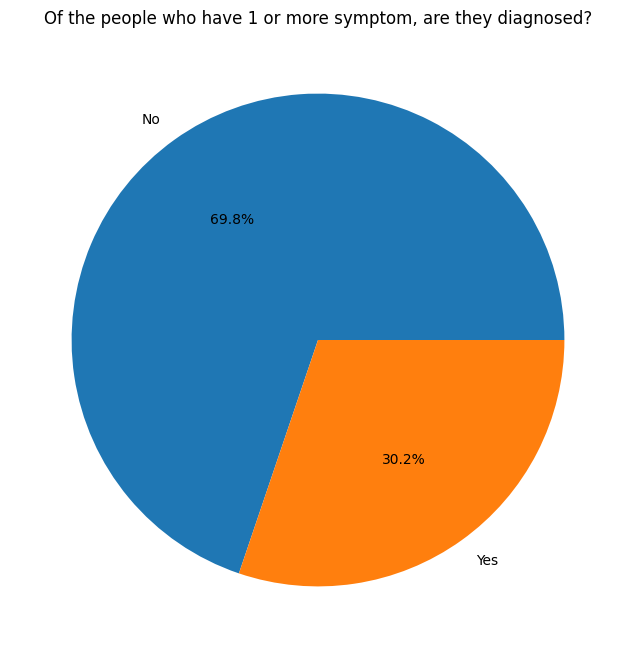

<Figure size 1000x800 with 0 Axes>

In [49]:
# Make a pie chart of the number of people who have symptoms and have a diagnosis (all people in this chart have symptoms, do they have a diagnosis?)
plt.pie(s_vs_d, labels=['No', 'Yes'], autopct='%1.1f%%')
plt.title('Of the people who have 1 or more symptom, are they diagnosed?')
plt.show()
plt.savefig('SymptomsDiagnosis.png')

In [51]:
# How many people with 4 or more symptoms are diagnosed?
alzheimer_total_symptoms[alzheimer_total_symptoms['Total Symptoms Count'] >= 4]['Diagnosis'].value_counts()

,count
Diagnosis,
1,24
0,23


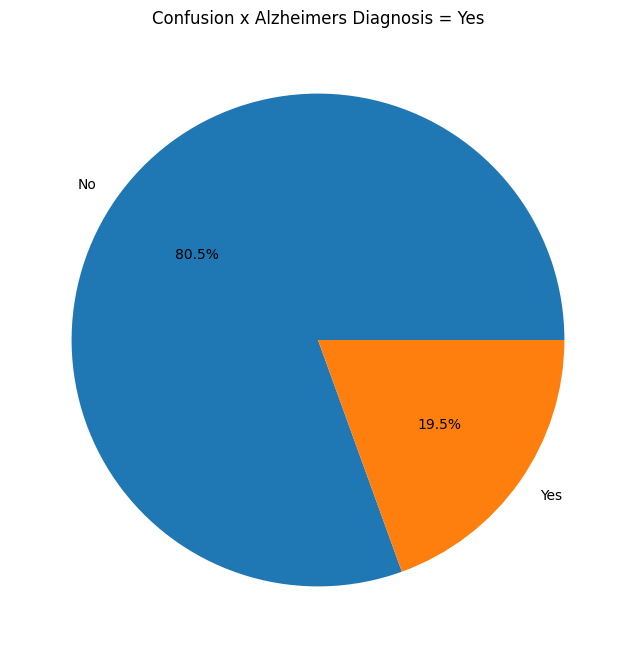

<Figure size 1000x800 with 0 Axes>

In [55]:
# Group data
diagnosis_yes_count = diagnosis_yes['Confusion'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Confusion x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('Confusion.png')

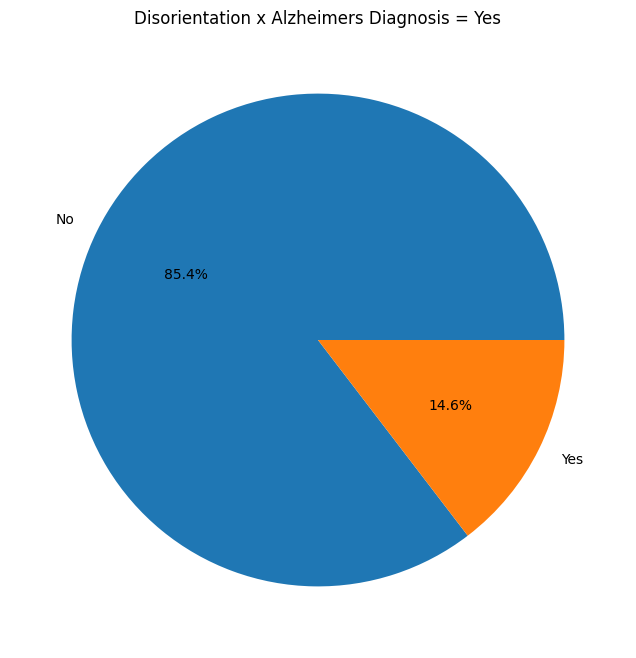

<Figure size 1000x800 with 0 Axes>

In [56]:
# Group data
diagnosis_yes_count = diagnosis_yes['Disorientation'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Disorientation x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('Disorientation.png')

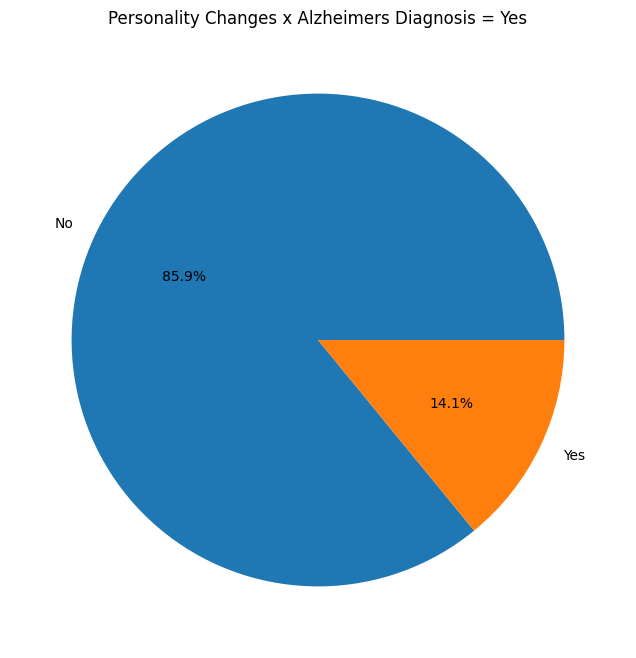

<Figure size 1000x800 with 0 Axes>

In [62]:
# Group data
diagnosis_yes_count = diagnosis_yes['PersonalityChanges'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Personality Changes x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('PersonalityChanges.png')

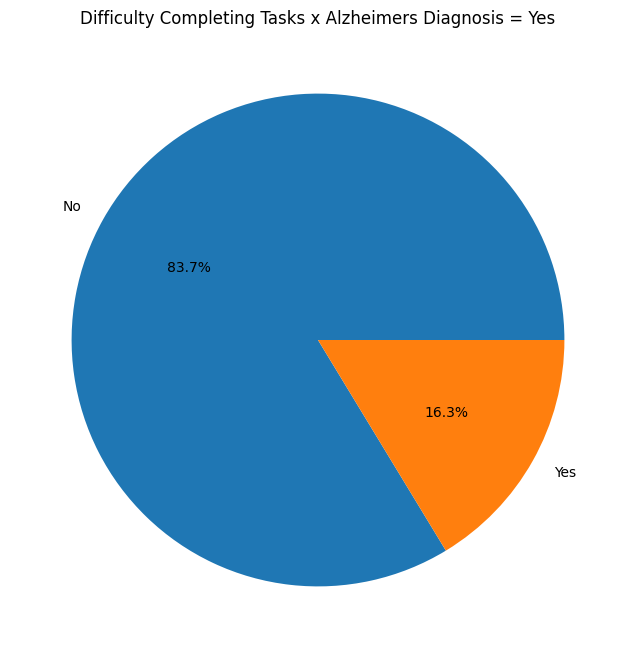

<Figure size 1000x800 with 0 Axes>

In [58]:
# Group data
diagnosis_yes_count = diagnosis_yes['DifficultyCompletingTasks'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Difficulty Completing Tasks x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('DCT.png')

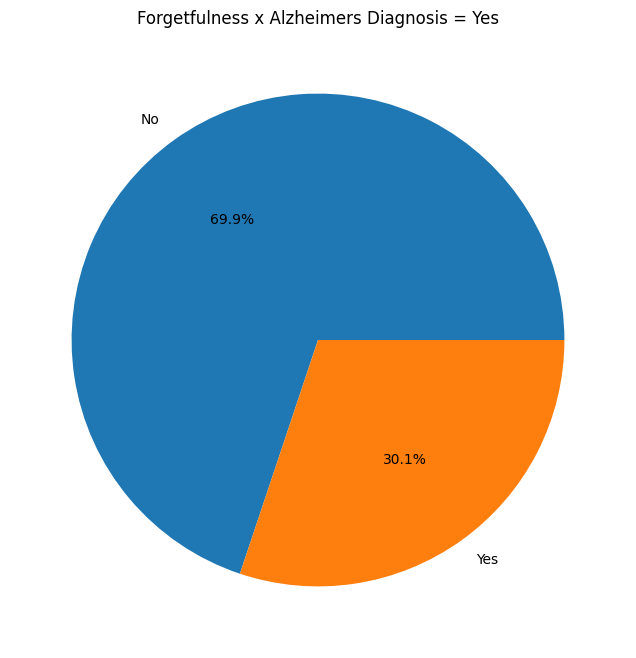

<Figure size 1000x800 with 0 Axes>

In [59]:
# Group data
diagnosis_yes_count = diagnosis_yes['Forgetfulness'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Forgetfulness x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('Forgetfulness.png')

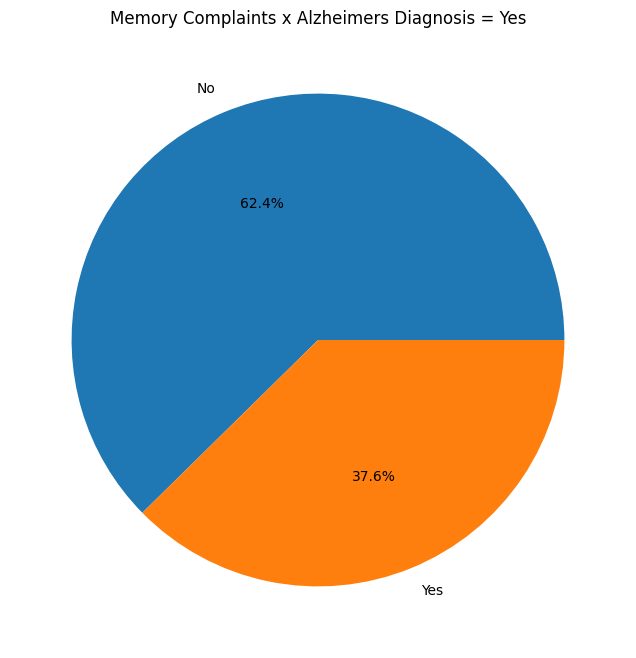

<Figure size 1000x800 with 0 Axes>

In [60]:
# Group data
diagnosis_yes_count = diagnosis_yes['MemoryComplaints'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Memory Complaints x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('MemoryComplaints.png')

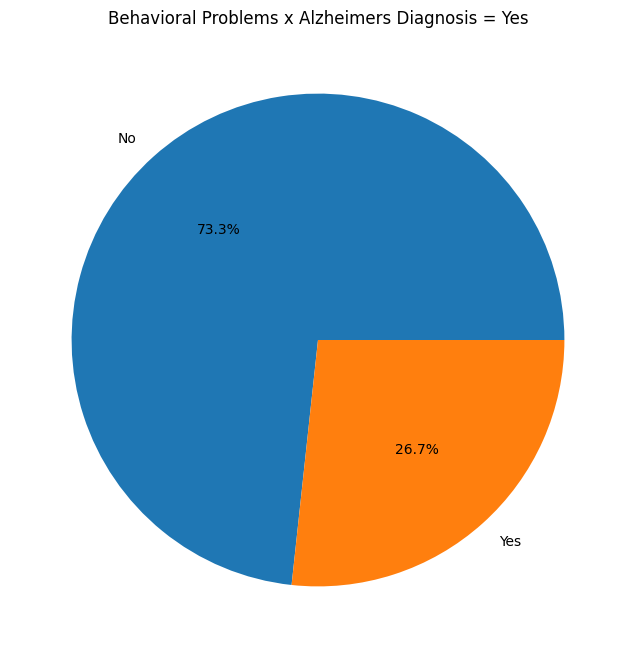

<Figure size 1000x800 with 0 Axes>

In [61]:
# Group data
diagnosis_yes_count = diagnosis_yes['BehavioralProblems'].value_counts()

# Create Pie Chart with Title and labels for YES Diagnosis
plt.pie(diagnosis_yes_count, labels=diagnosis_yes_count.index, autopct='%1.1f%%')
plt.title('Behavioral Problems x Alzheimers Diagnosis = Yes')

# Show the plot
plt.show()
plt.savefig('BehavioralProblems.png')

# **CORRELATION**

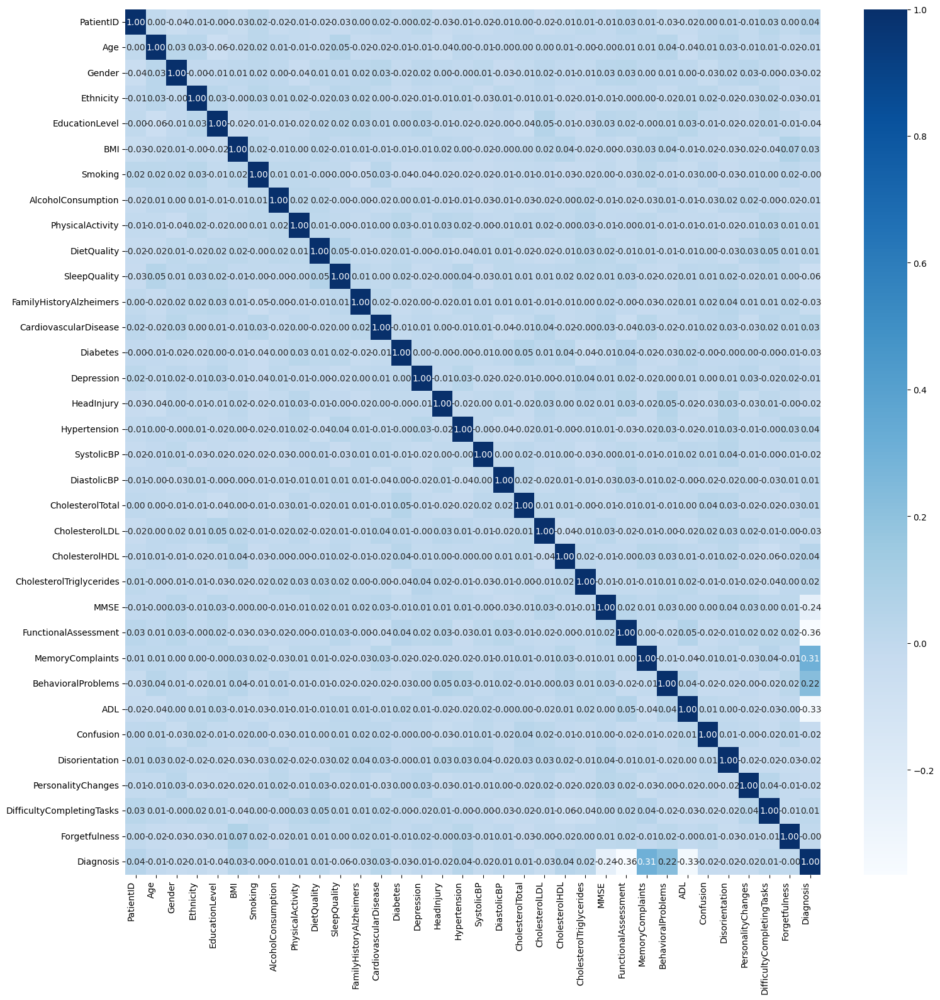

In [52]:
# Create a Heatmap analysis of the entire data
plt.figure(figsize = (16,16))
sns.heatmap(alzheimer_df.corr(), cmap = 'Blues', annot = True, fmt = ".2f")
plt.xticks(rotation = 90, ha = 'right')
plt.tight_layout()
plt.show()

In [53]:
# Show the correlations between the features
correlations = alzheimer_df.corr()['Diagnosis'].abs().sort_values(ascending=False)
correlations

,Diagnosis
Diagnosis,1.000000
FunctionalAssessment,0.364898
ADL,0.332346
MemoryComplaints,0.306742
MMSE,0.237126
BehavioralProblems,0.224350
SleepQuality,0.056548
EducationLevel,0.043966
CholesterolHDL,0.042584
PatientID,0.041019


In [54]:
# Print the top 5 correlations between the features
correlations.head(6)

,Diagnosis
Diagnosis,1.000000
FunctionalAssessment,0.364898
ADL,0.332346
MemoryComplaints,0.306742
MMSE,0.237126
BehavioralProblems,0.224350
